<h1>Machine Learning notebook

In [120]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
import seaborn as sns
pd.set_option('display.max_columns', None)
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer


In [121]:
filepath = '/Users/efkanturedi/Corteze/Python_output_folders/Ecommerce/final_for_ML.csv'

master_df_clean = pd.read_csv(filepath)

In [122]:
master_df_clean = master_df_clean.sample(10000)

In [123]:
master_df_clean.set_index('customer_unique_id',inplace=True)

In [124]:
master_df_clean.isna().sum().sum()

0

In [125]:
master_df_clean.shape

(10000, 7)

In [126]:
master_df_clean = master_df_clean.dropna()

In [127]:
master_df_clean.shape

(10000, 7)

In [128]:
master_df_clean.isna().sum()

order_id               0
order_purchase_date    0
order_item_id          0
total_price            0
today                  0
recency                0
average_price          0
dtype: int64

In [129]:
colonnes = master_df_clean.columns
table = pd.DataFrame(columns=['name','types'])
for col in colonnes:
  table = table.append(
    {
      'name': col,
      'types': master_df_clean[col].dtype
    }
  ,ignore_index=True)

In [130]:
table

,name,types
0,order_id,object
1,order_purchase_date,object
2,order_item_id,float64
3,total_price,float64
4,today,object
5,recency,int64
6,average_price,float64


<h2> Data Prep

In [131]:
from sklearn.preprocessing import StandardScaler

In [132]:
sub_df = master_df_clean[
  ['total_price','average_price','order_item_id','recency']
]

In [133]:
ss = StandardScaler()
scaled_sub_df = ss.fit_transform(sub_df)

<h2>T-SNE


In [134]:
from sklearn.manifold import TSNE

In [135]:
tsne = TSNE()
T = tsne.fit_transform(scaled_sub_df.copy())

/Users/efkanturedi/opt/anaconda3/envs/py39/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'Représentation du jeu de données via T-SNE'}>

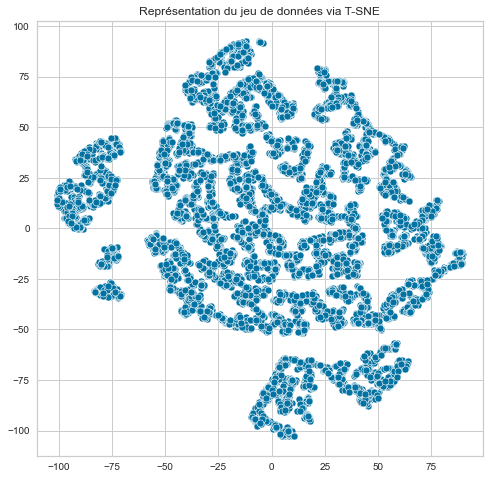

In [136]:
plt.figure(figsize=(8,8))
plt.title('Représentation du jeu de données via T-SNE')
sns.scatterplot(T[:,0], T[:,1])

<h2>KMeans

In [137]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

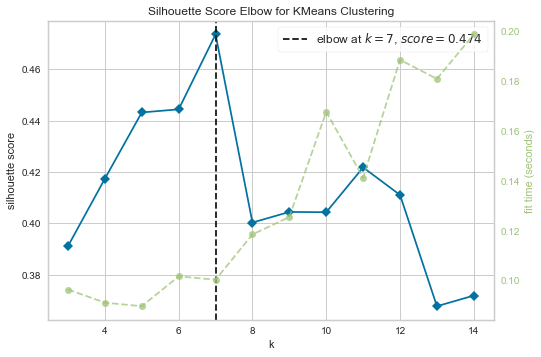

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [138]:
model = KMeans()
visualizer = KElbowVisualizer(model, k=(3,15),metric='silhouette')

visualizer.fit(scaled_sub_df)    # Fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

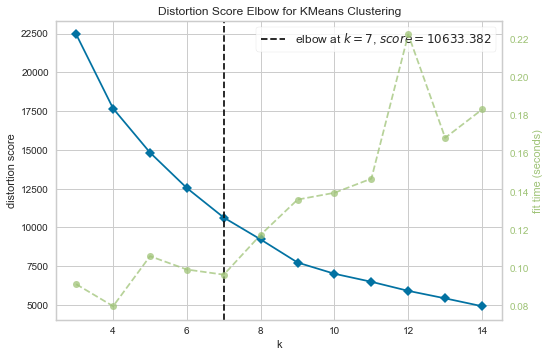

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [139]:
visualizer = KElbowVisualizer(model, k=(3,15))
visualizer.fit(scaled_sub_df)    # Fit the data to the visualizer
visualizer.poof()  

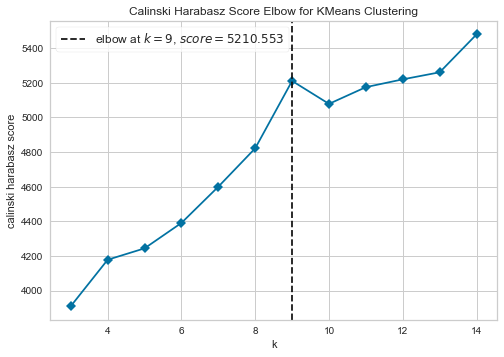

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [140]:
# Instantiate the clustering model and visualizer 
model = KMeans()
visualizer = KElbowVisualizer(model, k=(3,15), metric='calinski_harabasz', timings=False)

visualizer.fit(scaled_sub_df)    # Fit the data to the visualizer
visualizer.poof() 

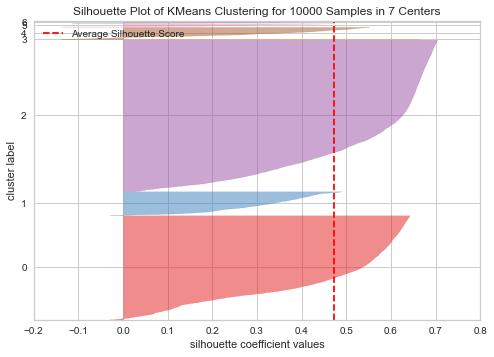

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 10000 Samples in 7 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [141]:
model = KMeans(7)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(scaled_sub_df)    # Fit the data to the visualizer
visualizer.poof() 

In [142]:
# Let's see how this clustering looks like
k_means = KMeans(n_clusters=7, random_state=1)
k_means.fit(scaled_sub_df)
cluster = k_means.labels_

In [143]:
centers = k_means.cluster_centers_
y_kmeans = model.predict(scaled_sub_df)

/Users/efkanturedi/opt/anaconda3/envs/py39/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(-5.0, 20.0)

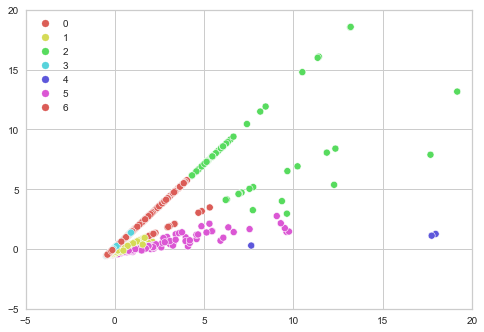

In [144]:
sns.scatterplot(scaled_sub_df[:,0], scaled_sub_df[:,1],c=k_means.labels_, s=50, cmap='viridis',hue=k_means.labels_,palette='hls')
plt.xlim(-5,20)
plt.ylim(-5,20)

/Users/efkanturedi/opt/anaconda3/envs/py39/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'Représentation du jeu de données via T-SNE'}>

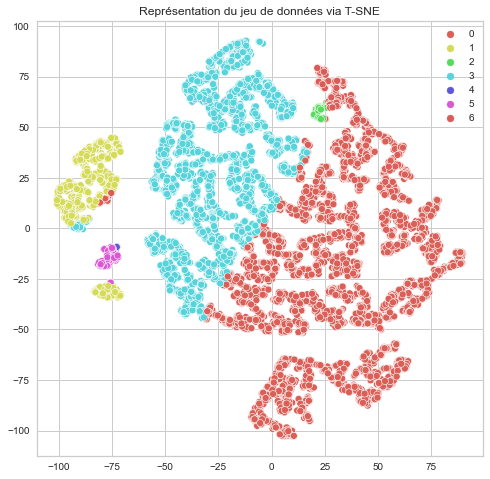

In [145]:
plt.figure(figsize=(8,8))
plt.title('Représentation du jeu de données via T-SNE')
sns.scatterplot(T[:,0], T[:,1],hue=k_means.labels_,legend='full',palette="hls")

<h2>DBScan

In [146]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

In [147]:
dbs = DBSCAN(eps = 1, 
             min_samples=5,
               n_jobs=-1).fit(scaled_sub_df.copy())

In [148]:
silhouette_score(scaled_sub_df,dbs.labels_)

0.3859055175729256

/Users/efkanturedi/opt/anaconda3/envs/py39/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'Représentation de la séparation des données du DBSCAN via T-SNE'}>

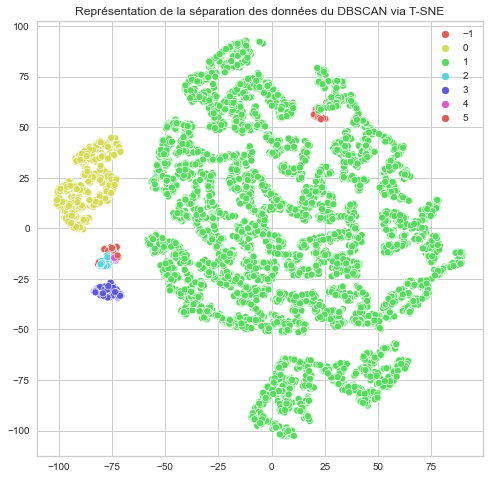

In [149]:
plt.figure(figsize=(8,8))
plt.title('Représentation de la séparation des données du DBSCAN via T-SNE')
sns.scatterplot(T[:,0], T[:,1], dbs.labels_,palette="hls")

In [151]:
k_means = KMeans(n_clusters=7, random_state=1)
k_means.fit(scaled_sub_df)
cluster = k_means.labels_
df_rfm_7 = master_df_clean.assign(Cluster=cluster)
df_group_7 = df_rfm_7.groupby('Cluster')
df_group_7.agg({
    'recency': 'mean',
    'order_item_id': 'mean',
    'total_price': ['mean', 'count']
  }).round(1)

recency order_item_id total_price      
           mean          mean        mean count
Cluster                                        
0         136.2           1.0       100.7  5092
1         226.0           2.2       240.8   804
2         212.8           1.4      2741.3    62
3         399.5           1.0       104.4  3518
4         335.6          12.4      6189.0     5
5         255.0           4.5       929.2   114
6         234.4           1.1       709.6   405

In [152]:
df_rfm_7

,order_id,order_purchase_date,order_item_id,total_price,today,recency,average_price,Cluster
customer_unique_id,,,,,,,,
881483770fdbfedae83075ad3ac0a289,1d5f437b878f76103ac129b13e81bbbb,2018-08-03,2.0,179.70,2018-09-03,31,89.850,1
72a1dace457b5b4565b174be16891f09,7199dc9a44c0b42b4341b93f376623e5,2017-06-08,1.0,119.80,2018-09-03,452,119.800,3
669dd06846ae9e7d1634981bdb2f08c6,30f95ea478d6e49bbf813ec20e149cd2,2018-06-27,1.0,135.90,2018-09-03,68,135.900,0
05c567475380140907b9ca53ba1dcfeb,d139bb03af910e29eab280ed63bec613,2018-08-23,2.0,55.47,2018-09-03,11,27.735,1
4458faa1e4fbc76c9042d5ded0b53244,96f5dfe006638550afa4d6390fc074c1,2017-12-12,2.0,225.00,2018-09-03,265,112.500,1
...,...,...,...,...,...,...,...,...
0c75c5ef968e1e8a53c91277d2417ffb,0fb5a3160f044b869ebab3a1d50f0471,2017-09-02,1.0,119.80,2018-09-03,366,119.800,3
3f20a510266ac248d87cb6778c77d87a,45ec898b8788003690b15eb232f9de53,2018-03-14,1.0,27.90,2018-09-03,173,27.900,0
379e4b6c7f7a996e735ba50e7dc353c8,09afbfa0da8baf5f4eb28c82f7209afd,2018-01-20,1.0,99.90,2018-09-03,226,99.900,0
